**Group 18 Project**

# Can we Predict the Winner of an ATP Men's Tennis Match based on the players' Aces and Break Point Data?

**Introduction**

The sport of tennis provides an exhilarating watch due to an abundance of high pressure moments, many of which come at break points. This is when a player is on the last point to win a game in a set in which their opponent is serving. Winning these gives a player a colossal advantage, whereas if the opponent that serves saves break points and does not concede games, the tide of the game may shift. Similarly, hitting serves that an opponent is unable to return is considered an ace and are vital to win points quickly. This investigation aims to predict the likelihood of a player winning a game based on the number of aces they hit, and the ratio between the amount break points they save to the amount that they face. To do so, data with statistics and outcomes of all ATP (Association of Tennis Professionals) officiated matches between 2017 and 2019 will be used to create data points of each winner and loser, their break point ratios, and the number of aces they hit.

**Loading the libraries**

In [6]:
#load the necessary libraries
library(tidyverse)
library(tidymodels)
library(dplyr)
library(kknn)
install.packages("kknn")

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done



In [7]:
# read data from web
tennis_2017 <- read.csv("https://raw.githubusercontent.com/JeffSackmann/tennis_atp/master/atp_matches_2017.csv")
tennis_2018 <- read.csv("https://raw.githubusercontent.com/JeffSackmann/tennis_atp/master/atp_matches_2018.csv")
tennis_2019 <- read.csv("https://raw.githubusercontent.com/JeffSackmann/tennis_atp/master/atp_matches_2019.csv")
tennis_data <- rbind(tennis_2017, tennis_2018, tennis_2019)
tennis_data

tourney_id,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_seed,winner_entry,⋯,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points
<chr>,<chr>,<chr>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
2017-M020,Brisbane,Hard,32,A,20170102,271,104678,NA,,⋯,53,33,13,11,6,10,29,1385,100,604
2017-M020,Brisbane,Hard,32,A,20170102,272,106378,NA,,⋯,67,39,27,12,9,10,45,1001,141,443
2017-M020,Brisbane,Hard,32,A,20170102,273,106298,6,,⋯,42,29,16,12,0,4,15,2156,25,1585
2017-M020,Brisbane,Hard,32,A,20170102,275,111577,NA,Q,⋯,37,27,7,10,2,5,105,570,34,1255
2017-M020,Brisbane,Hard,32,A,20170102,276,111442,NA,WC,⋯,43,23,13,9,10,15,79,689,160,372
2017-M020,Brisbane,Hard,32,A,20170102,277,103970,8,,⋯,44,29,12,11,5,9,21,1785,26,1465
2017-M020,Brisbane,Hard,32,A,20170102,278,105777,7,,⋯,36,21,7,8,4,8,17,2035,33,1320
2017-M020,Brisbane,Hard,32,A,20170102,279,103917,NA,,⋯,46,29,30,14,9,12,39,1102,54,854
2017-M020,Brisbane,Hard,32,A,20170102,280,105032,NA,WC,⋯,48,33,24,16,4,7,180,320,78,698


Firstly, we would just load the data from the web with the exact link source. We would use the datasets for 3 consecutive years, 2017, 2018 and 2019 and then combine them to a whole dataset. Combining data from multiple years helps expand the sample size and with a multi year dataset, we can build more accurate predictive models

**Selection of Variables**

As discussed in the introduction, two of the most pivotal factors in deciding the dynamic of a tennis match, and eventually the winner of the match, are how many aces each player hits and their ability to save break points and stay in the game. By hitting an ace serve the player gains a point in the game automatically. Hence, it could be predicted that hitting more aces in a game would give a player a higher chance of winning a game, as he would accumulate points faster with less energy expenditure which is critical in such a high intensity sport. Using the number of aces as a predictor for a match winner would therefore be appropriate. In order to do so, the rows w_ace and l_ace are selected which gather the data for the number of aces hit by the winner and loser of each match in the dataset. Similarly, by saving break points in a tennis match, the player does not concede a game in which his opponent would serve, giving them a considerable advantage. It can therefore be concluded that saving multiple break points would give a player a higher chance of winning as his opponent is not able to win consecutive games in a set, once again highlighting that this would be an appropriate predictor. The raw data required to formulate this predictor can be found in the columns w_bpSaved, l_bpSaved, w_bpFaced, and l_bpFaced.

In [2]:
tennis_select <- tennis_data |> select(w_ace, l_ace, w_bpSaved, l_bpSaved, w_bpFaced, l_bpFaced) |>
drop_na() |> filter(w_bpSaved & l_bpSaved != 0)

tennis_select

w_ace,l_ace,w_bpSaved,l_bpSaved,w_bpFaced,l_bpFaced
<int>,<int>,<int>,<int>,<int>,<int>
11,0,1,6,3,10
11,11,2,9,3,10
1,1,1,10,2,15
3,5,2,5,3,9
13,9,2,9,4,12
20,9,8,4,10,7
6,3,4,3,4,5
3,6,4,8,8,13
5,2,4,5,7,9


After selecting the desirable columns, we remove the NA values and the the rows in which the values of l_bpSaved and w_bpSaved from the dataset, as it will not affect our prediction. In case we keep the NA values and the rows with both l_bpSaved and w_bpSaved being 0 and let the select function do its work, there are 2 problems. Firstly, the entire row will show NA, instead of numbers. Secondly, since we plan to create a new column (variable) call bpSaveoverpercentage, which is equal to w_bpSaved divided by l_bpSaved, if we do not remove the aforementioned rows, the bpSaveoverpercentage would be 0/0, leading to NaN.

The dataset above contains the number of aces, number of breakpoints saved and number of breakpoints faced for both a winner and loser in a single row. We want to make a row including the number of aces, the number of breakpoints saved and the number of breakpoints faced for only 1 player. Therefore, from this dataset, we create 2 seperate dataframes called "tennis_select_w", consisting of the figures of the winning player in a match, and "tennis_select_l", consisting of the figures of the losing player in a match

In [3]:
tennis_select_w <- select(tennis_select, w_ace, w_bpSaved, w_bpFaced) |>
    mutate(bpSaveoverpercentage = w_bpSaved/w_bpFaced)|>
    rename(ace= w_ace, bpSaved = w_bpSaved, bpFaced = w_bpFaced) |>
    mutate(result = 1) 

tennis_select_w

ace,bpSaved,bpFaced,bpSaveoverpercentage,result
<int>,<int>,<int>,<dbl>,<dbl>
11,1,3,0.3333333,1
11,2,3,0.6666667,1
1,1,2,0.5000000,1
3,2,3,0.6666667,1
13,2,4,0.5000000,1
20,8,10,0.8000000,1
6,4,4,1.0000000,1
3,4,8,0.5000000,1
5,4,7,0.5714286,1


In [4]:
tennis_select_l <- select(tennis_select,l_ace,l_bpSaved, l_bpFaced) |>
    mutate(bpSaveoverpercentage = l_bpSaved/l_bpFaced)|>
    rename(ace=l_ace, bpSaved=l_bpSaved, bpFaced=l_bpFaced) |>
    mutate(result = 0) 
tennis_select_l

ace,bpSaved,bpFaced,bpSaveoverpercentage,result
<int>,<int>,<int>,<dbl>,<dbl>
0,6,10,0.6000000,0
11,9,10,0.9000000,0
1,10,15,0.6666667,0
5,5,9,0.5555556,0
9,9,12,0.7500000,0
9,4,7,0.5714286,0
3,3,5,0.6000000,0
6,8,13,0.6153846,0
2,5,9,0.5555556,0


To elaborate on our decision for creating the new column bpSaveoverpercentage, it is expected that every player in every match would not face the same amount of break points, so to achieve consistency a ratio is formulated. This is done by using the mutate function to create bpSaveoverpercentage which represents the quantity of break points saved by a player as a ratio of the number of break points the player faces.

In [5]:
tennis_combined_data <- rbind(tennis_select_w, tennis_select_l) |> mutate (result = as.factor(result)) |> 
mutate(result = fct_recode(result, 'Lose' = '0', 'Win' = '1' ))
tennis_combined_data

ace,bpSaved,bpFaced,bpSaveoverpercentage,result
<int>,<int>,<int>,<dbl>,<fct>
11,1,3,0.3333333,Win
11,2,3,0.6666667,Win
1,1,2,0.5000000,Win
3,2,3,0.6666667,Win
13,2,4,0.5000000,Win
20,8,10,0.8000000,Win
6,4,4,1.0000000,Win
3,4,8,0.5000000,Win
5,4,7,0.5714286,Win


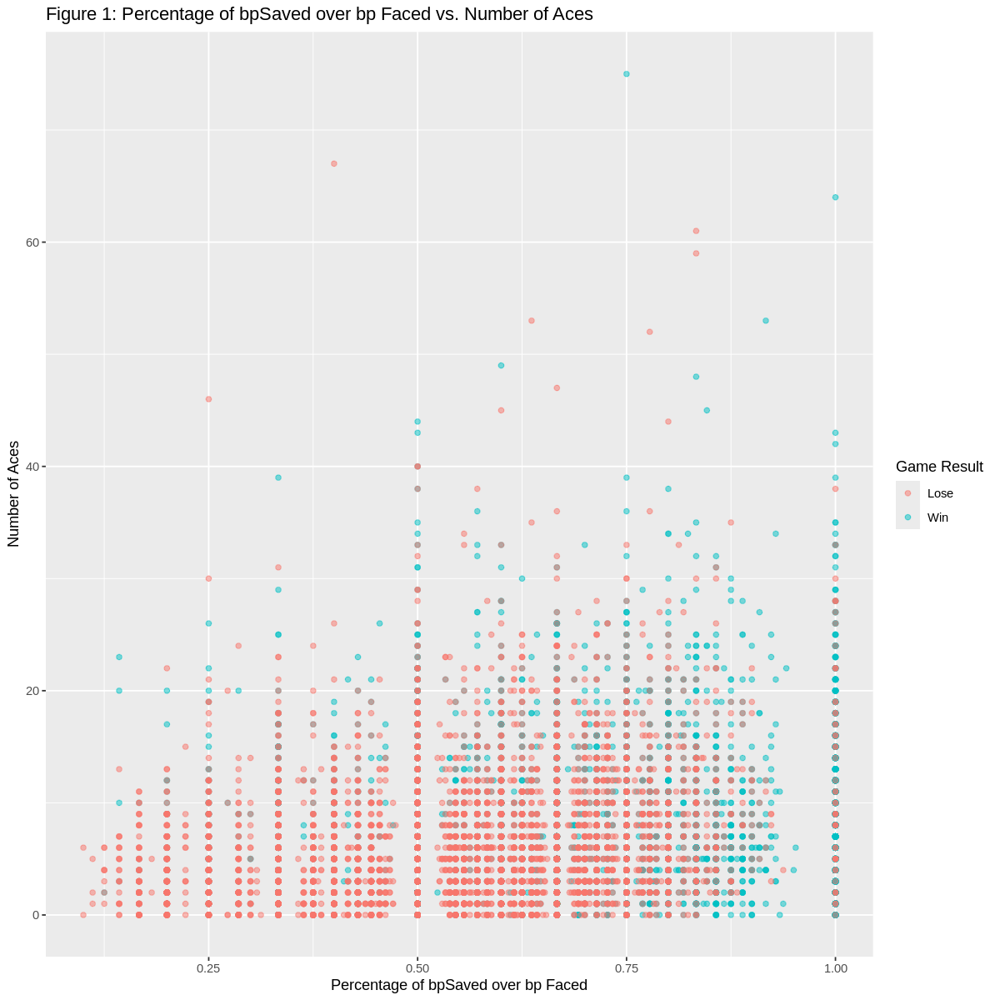

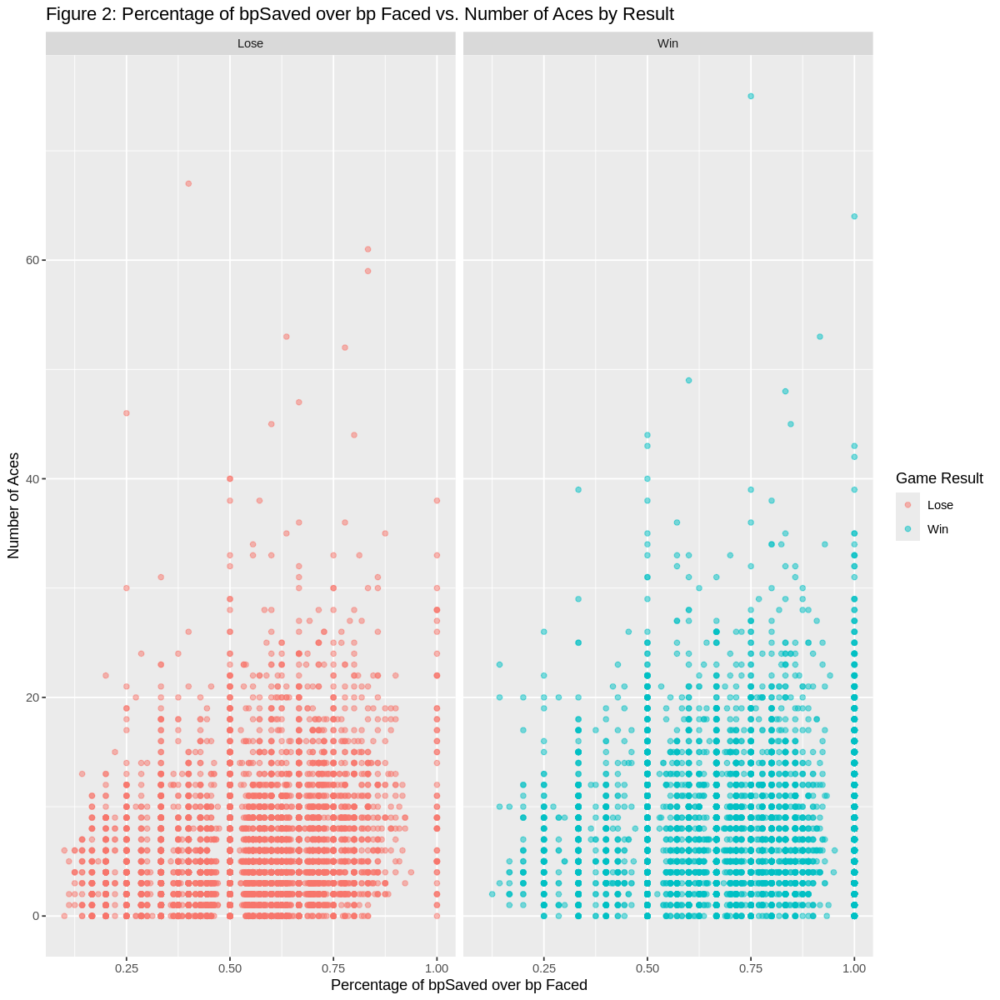

In [18]:
options(repr.plot.width = 10, repr.plot.height = 10)

tennis_combined_plot <- tennis_combined_data |>
                        ggplot(aes(x = bpSaveoverpercentage, y = ace)) +
                        geom_point(aes(colour = result), alpha = 0.5) +
                        labs(x= "Percentage of bpSaved over bp Faced", 
                             y="Number of Aces", 
                             colour="Game Result") +
                        ggtitle("Figure 1: Percentage of bpSaved over bp Faced vs. Number of Aces")


separate_graph <- tennis_combined_plot + 
                    facet_grid(cols = vars(result)) + 
                    ggtitle("Figure 2: Percentage of bpSaved over bp Faced vs. Number of Aces by Result")

tennis_combined_plot
separate_graph

In [22]:
set.seed(1)
tennis_split <- initial_split(tennis_combined_data, prop = 0.75, strata = result)
tennis_train <- training(tennis_split)
tennis_test <- testing(tennis_split)


In [23]:
tennis_proportion <- tennis_train |>
                     group_by(result) |>
                     summarize(observations = n()) |>
                     mutate(percent = 100*observations/nrow(tennis_train))
tennis_proportion

result,observations,percent
<fct>,<int>,<dbl>
Lose,4983,50
Win,4983,50


In [24]:
tennis_recipe <- recipe(result ~ bpSaveoverpercentage + ace, data = tennis_train) |>
  step_scale(all_predictors()) |>
  step_center(all_predictors()) 

In [25]:
tennis_vfold <- vfold_cv(tennis_train, v = 5, strata = result)

In [26]:
tennis_tune <- nearest_neighbor(weight_func = 'rectangular', neighbors = tune()) |>
                set_engine('kknn') |>
                set_mode('classification')

In [27]:
set.seed(1)

k_vals <- tibble(neighbors = seq(from = 1, to = 50, by = 2))

knn_results <- workflow() |>
                 add_recipe(tennis_recipe) |>
                 add_model(tennis_tune) |>
                 tune_grid(resamples = tennis_vfold, grid = k_vals) |> 
                 collect_metrics()

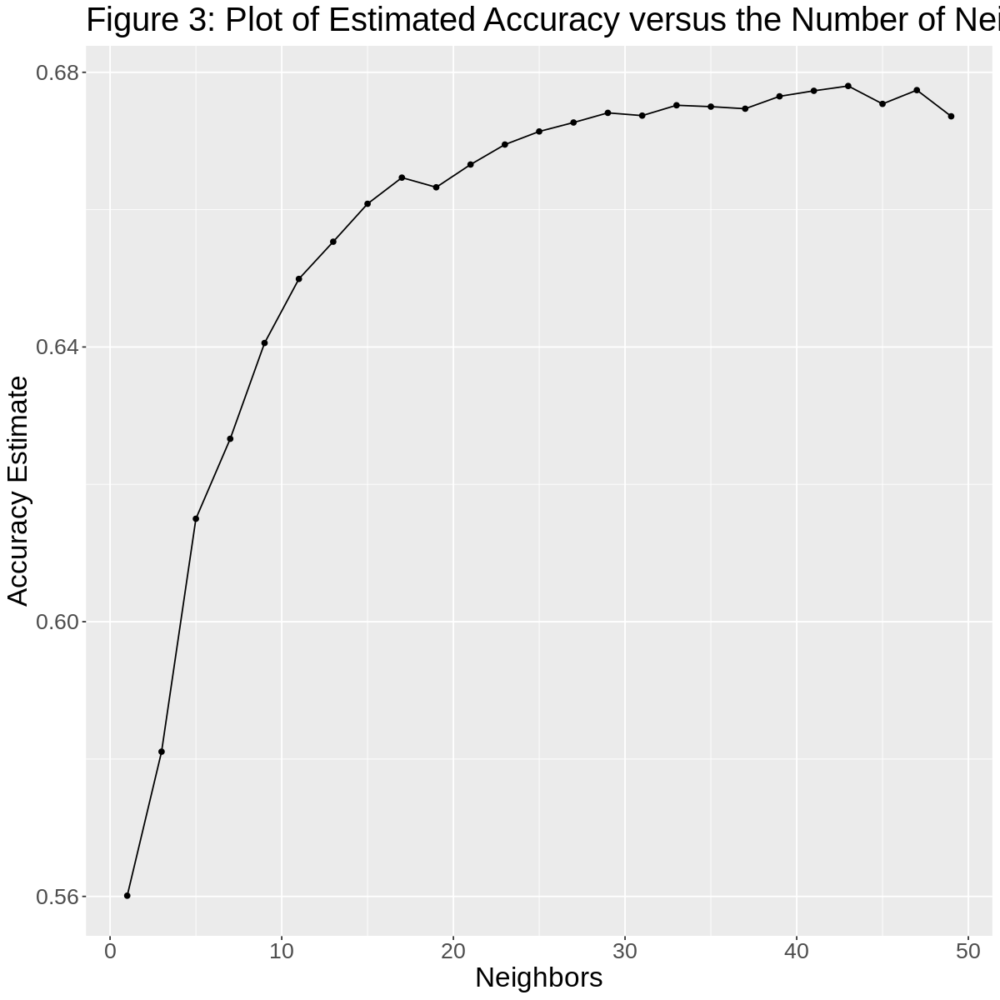

In [28]:
accuracies <- knn_results |>
                 filter(.metric == 'accuracy')

cross_val_plot <- ggplot(accuracies, aes(x = neighbors, y = mean)) +
                  geom_point() +
                  geom_line() +
                  ggtitle('Figure 3: Plot of Estimated Accuracy versus the Number of Neighbors') +
                  labs(x = 'Neighbors', y = 'Accuracy Estimate') +
                  theme(text = element_text(size = 20))

cross_val_plot

In [29]:
tennis_recipe <- recipe(result ~ bpSaveoverpercentage + ace, data = tennis_train) |>
  step_scale(all_predictors()) |>
  step_center(all_predictors()) 

knn_spec <- nearest_neighbor(weight_func = 'rectangular', neighbors = 43) |>
                set_engine('kknn') |>
                set_mode('classification')

tennis_fit <- workflow() |>
                    add_recipe(tennis_recipe) |>
                    add_model(knn_spec) |>
                    fit(tennis_train)

In [30]:
tennis_test_predictions <- predict(tennis_fit, tennis_test) |>
  bind_cols(tennis_test)

tennis_test_predictions |>
  metrics(truth = result, estimate = .pred_class) |>
  filter(.metric == "accuracy")

tennis_test_predictions

.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
accuracy,binary,0.6850181


.pred_class,ace,bpSaved,bpFaced,bpSaveoverpercentage,result
<fct>,<int>,<int>,<int>,<dbl>,<fct>
Win,11,11,13,0.8461538,Win
Lose,7,5,7,0.7142857,Win
Win,12,4,8,0.5000000,Win
Lose,0,2,3,0.6666667,Win
Win,2,3,4,0.7500000,Win
Lose,6,3,5,0.6000000,Win
Win,8,9,11,0.8181818,Win
Win,8,3,4,0.7500000,Win
Lose,4,3,5,0.6000000,Win


In [31]:
confusion <- tennis_test_predictions |>
             conf_mat(truth = result, estimate = .pred_class) 
confusion

          Truth
Prediction Lose  Win
      Lose 1332  717
      Win   330  945